# NYC Taxi Prediction Model
## Author: Aron Gu
## Date: November 3, 2024

## Install Packages not Available in Conda Environment

In [90]:
# Install extra packages
!pip3 install geopy
!pip3 install folium

## Import Necessary Libraries to Build Prediction Model

In [91]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from geopy.distance import geodesic
import folium
from folium.plugins import HeatMap, MarkerCluster
import sklearn
from sklearn.metrics import r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

## Problem Statement
At some point or the other almost each one of us has used an Ola or Uber for taking a ride.

Ride hailing services are services that used online-enabled platforms to connect between passengers and local drivers using their personal vehicles. Inmost cases they are a comfortable method for door-to-door transport. Usually they are cheaper than using licensed taxi cabs. Examples of ride hailing services include Uber and Lyft.

To improve the efficiency of taxi dispatching systems for such services, it is important to be able to predict how long a driver will have his taxi occupied. If a dispatcher knew approximately when a taxi driver would be ending their current ride, they would be better able to identify which driver to assign to each pickup request.

In this problem, we will build ML models to predict the total ride duration of taxi trips in New York City.

## Dataset Overview
The following columns are shown in this dataset with around 729000 rows:
- **id** - a unique identifier for each trip
- **vendor_id** - a code indicating the provider associated with the trip record
- **pickup_datetime** - date and time when the meter was engaged
- **dropoff_datetime** - date at time when the meter was disengaged
- **passenger_count** - the number of passengers in the vehicle(driver entered value)
- **pickup_longitude** - the longitude where the meter was engaged
- **pickup_latitude** - the latitude where the meter was engaged
- **dropoff_longitude** - the longitude where the meter was disengaged
- **dropoff_latitude** - the latitude where the meter was disengaged
- **store_and_forward_flag** - this flag indicates whether the trip record was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server(Y=store and forward; N=not a store and forward trip)

# 1. EDA

## Load NYC Taxi Dataset

In [92]:
# Import data from NYC taxi dataset
data = pd.read_csv('nyc_taxi_trip_duration.csv')

In [93]:
# First 5 rows of dataset
data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id1080784,2,2016-02-29 16:40:21,2016-02-29 16:47:01,1,-73.953918,40.778873,-73.963875,40.771164,N,400
1,id0889885,1,2016-03-11 23:35:37,2016-03-11 23:53:57,2,-73.988312,40.731743,-73.994751,40.694931,N,1100
2,id0857912,2,2016-02-21 17:59:33,2016-02-21 18:26:48,2,-73.997314,40.721458,-73.948029,40.774918,N,1635
3,id3744273,2,2016-01-05 09:44:31,2016-01-05 10:03:32,6,-73.961670,40.759720,-73.956779,40.780628,N,1141
4,id0232939,1,2016-02-17 06:42:23,2016-02-17 06:56:31,1,-74.017120,40.708469,-73.988182,40.740631,N,848


In [94]:
# Last 5 rows of dataset
data.tail()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
729317,id3905982,2,2016-05-21 13:29:38,2016-05-21 13:34:34,2,-73.965919,40.789780,-73.952637,40.789181,N,296
729318,id0102861,1,2016-02-22 00:43:11,2016-02-22 00:48:26,1,-73.996666,40.737434,-74.001320,40.731911,N,315
729319,id0439699,1,2016-04-15 18:56:48,2016-04-15 19:08:01,1,-73.997849,40.761696,-74.001488,40.741207,N,673
729320,id2078912,1,2016-06-19 09:50:47,2016-06-19 09:58:14,1,-74.006706,40.708244,-74.013550,40.713814,N,447
729321,id1053441,2,2016-01-01 17:24:16,2016-01-01 17:44:40,4,-74.003342,40.743839,-73.945847,40.712841,N,1224


In [95]:
# Get dimensions/shape of dataset
data.shape

(729322, 11)

In [96]:
# Get all columns from dataset
data.columns

Index(['id', 'vendor_id', 'pickup_datetime', 'dropoff_datetime',
       'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'trip_duration'],
      dtype='object')

In [97]:
# Find what data type each column is
data.dtypes

id                     object
vendor_id               int64
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
pickup_longitude      float64
pickup_latitude       float64
dropoff_longitude     float64
dropoff_latitude      float64
store_and_fwd_flag     object
trip_duration           int64
dtype: object

In [98]:
# Numerical datatypes in dataset
data.select_dtypes(include=['int64','float64','Int64']).dtypes

vendor_id              int64
passenger_count        int64
pickup_longitude     float64
pickup_latitude      float64
dropoff_longitude    float64
dropoff_latitude     float64
trip_duration          int64
dtype: object

In [99]:
# Get data info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 729322 entries, 0 to 729321
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   id                  729322 non-null  object 
 1   vendor_id           729322 non-null  int64  
 2   pickup_datetime     729322 non-null  object 
 3   dropoff_datetime    729322 non-null  object 
 4   passenger_count     729322 non-null  int64  
 5   pickup_longitude    729322 non-null  float64
 6   pickup_latitude     729322 non-null  float64
 7   dropoff_longitude   729322 non-null  float64
 8   dropoff_latitude    729322 non-null  float64
 9   store_and_fwd_flag  729322 non-null  object 
 10  trip_duration       729322 non-null  int64  
dtypes: float64(4), int64(3), object(4)
memory usage: 61.2+ MB


In [100]:
# Get statistics on dataset
data.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,729322.000000,729322.000000,729322.000000,729322.000000,729322.000000,729322.000000,7.293220e+05
mean,1.535403,1.662055,-73.973513,40.750919,-73.973422,40.751775,9.522291e+02
std,0.498745,1.312446,0.069754,0.033594,0.069588,0.036037,3.864626e+03
min,1.000000,0.000000,-121.933342,34.712234,-121.933304,32.181141,1.000000e+00
25%,1.000000,1.000000,-73.991859,40.737335,-73.991318,40.735931,3.970000e+02
50%,2.000000,1.000000,-73.981758,40.754070,-73.979759,40.754509,6.630000e+02
75%,2.000000,2.000000,-73.967361,40.768314,-73.963036,40.769741,1.075000e+03
max,2.000000,9.000000,-65.897385,51.881084,-65.897385,43.921028,1.939736e+06


In [101]:
# Get the medians for each column
data.median(numeric_only=True)

vendor_id              2.000000
passenger_count        1.000000
pickup_longitude     -73.981758
pickup_latitude       40.754070
dropoff_longitude    -73.979759
dropoff_latitude      40.754509
trip_duration        663.000000
dtype: float64

In [102]:
# Get the mode for each column
data.mode(numeric_only=True)

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
0,2,1,-73.98214,40.774101,-73.98233,40.750149,348


## Identify Missing Values in Dataset

In [103]:
# Find number of missing values in each column:
data.isnull().sum()

id                    0
vendor_id             0
pickup_datetime       0
dropoff_datetime      0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64

- There are no missing values in the dataset, so no imputation has to be performed.

## Identify Outliers in Dataset(For Target Variable)

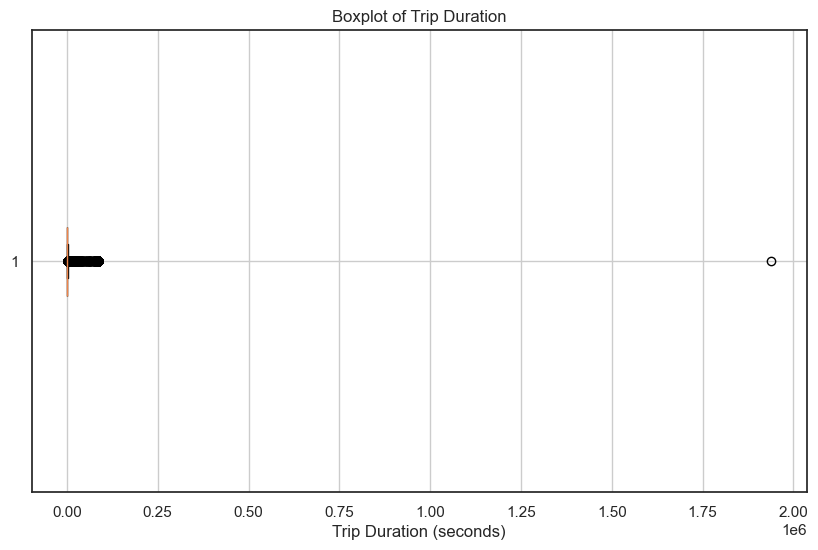

In [104]:
# Visualize outliers with a boxplot for trip duration
plt.figure(figsize=(10,6))
plt.boxplot(data['trip_duration'], vert=False, patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.title('Boxplot of Trip Duration')
plt.xlabel('Trip Duration (seconds)')
plt.grid(True)
plt.show()

In [105]:
# Due to bad scaling on box plot, find number of trips within a certain time threshold(in this case less than 15000 seconds)
# Counting the number of trips with a duration less than 15000 seconds
num_trips_less_than_15000 = data[data['trip_duration'] < 15000].shape[0]

num_trips_less_than_15000

728306

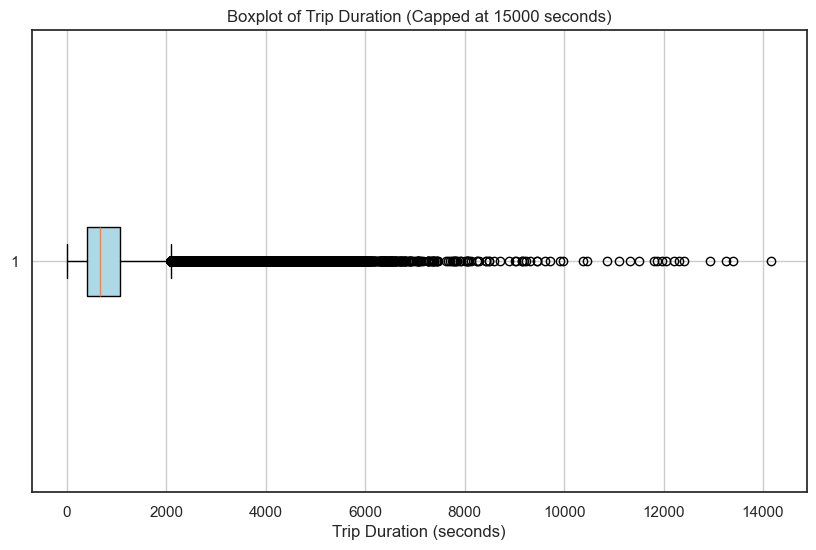

In [106]:
# Adjusting the boxplot by limiting the range of trip_duration to exclude extreme outliers for better visualization
plt.figure(figsize=(10,6))
plt.boxplot(data[data['trip_duration'] <= 15000]['trip_duration'], 
            vert=False, patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.title('Boxplot of Trip Duration (Capped at 15000 seconds)')
plt.xlabel('Trip Duration (seconds)')
plt.grid(True)
plt.show()

In [107]:
# Detecting outliers using IQR
Q1 = data['trip_duration'].quantile(0.25)
Q3 = data['trip_duration'].quantile(0.75)
IQR = Q3 - Q1

# Defining outliers as values outside 1.5 * IQR from the Q1 and Q3 bounds
lower_bound = max(Q1 - 1.5 * IQR, 0)
upper_bound = Q3 + 1.5 * IQR

outliers = data[(data['trip_duration'] < lower_bound) | (data['trip_duration'] > upper_bound)]

# Number of outliers
num_outliers = outliers.shape[0]
print("IQR:",IQR)
print("Lower bound for non-outlier values:",lower_bound) # Note that lower bound can't be negative since time is a non-negative value
print("Upper bound for non-outlier values:",upper_bound)
print("Number of outliers for trip duration:",num_outliers)

IQR: 678.0
Lower bound for non-outlier values: 0
Upper bound for non-outlier values: 2092.0
Number of outliers for trip duration: 36963


- With 36963 outliers in the dataset, this could potentially affect the prediction models in later stages. 

## Identify Outliers in Dataset(For Passenger Count)

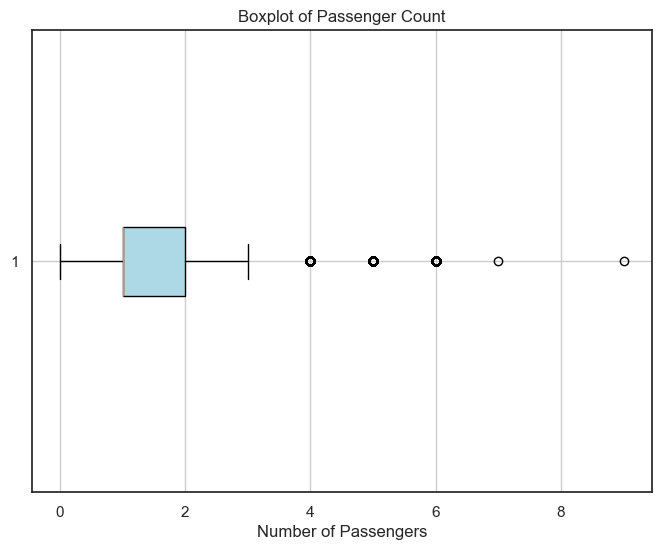

In [108]:
# Plot a boxplot for passenger count
plt.figure(figsize=(8, 6))
plt.boxplot(data['passenger_count'], vert=False, patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.title('Boxplot of Passenger Count')
plt.xlabel('Number of Passengers')
plt.grid(True)
plt.show()

In [109]:
# Calculate IQR for outlier detection
Q1 = data['passenger_count'].quantile(0.25)
Q3 = data['passenger_count'].quantile(0.75)
IQR = Q3 - Q1

# Define outlier bounds
lower_bound = max(Q1 - 1.5 * IQR, 0)
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
passenger_outliers = data[(data['passenger_count'] < lower_bound) | (data['passenger_count'] > upper_bound)]

# Print out the results
print(f"Lower bound for outliers: {lower_bound}") # Lower bound of passenger can't be negative
print(f"Upper bound for outliers: {upper_bound}")
print(f"Number of outliers detected: {passenger_outliers.shape[0]}")

Lower bound for outliers: 0
Upper bound for outliers: 3.5
Number of outliers detected: 77085


## Trip Duration Distribution

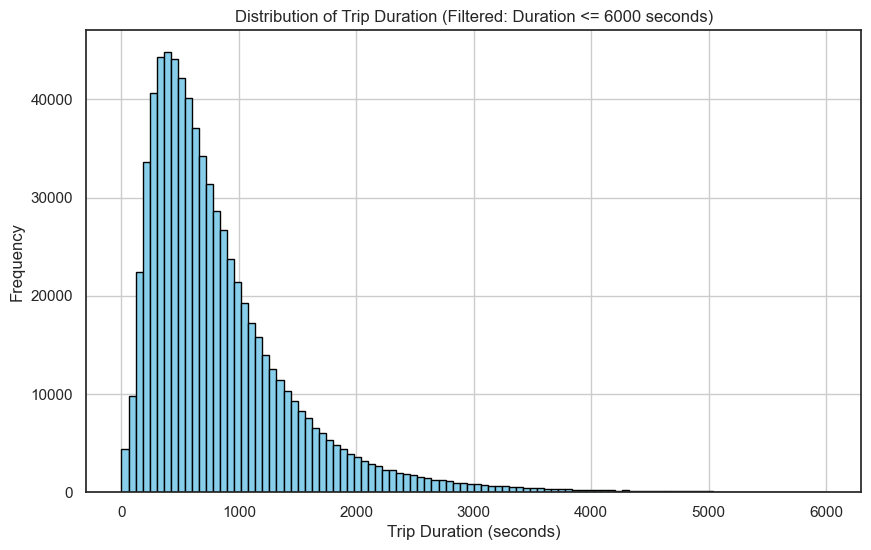

In [110]:
# Plotting the distribution of trip duration (filtered to 6000 seconds or less for better visualization)

# Filter data to include only trips with duration <= 6000 seconds
filtered_data = data[(data['trip_duration'] <= 6000)]
plt.figure(figsize=(10, 6))
filtered_data['trip_duration'].plot(kind='hist', bins=100, color='skyblue', edgecolor='black')
plt.title('Distribution of Trip Duration (Filtered: Duration <= 6000 seconds)')
plt.xlabel('Trip Duration (seconds)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

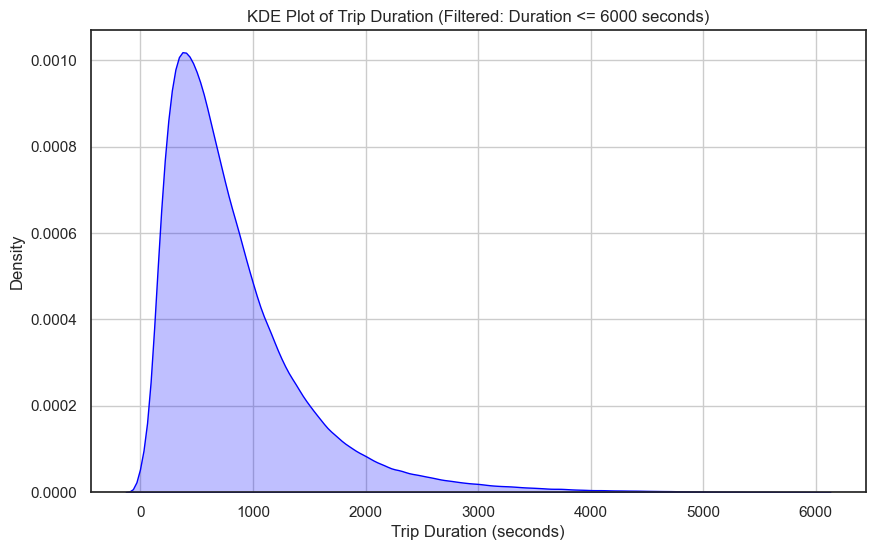

In [111]:
# Plotting the KDE for trip duration (filtered to 100000 seconds or less for better visualization)
plt.figure(figsize=(10, 6))
sns.kdeplot(filtered_data['trip_duration'], color='blue', fill=True)
plt.title('KDE Plot of Trip Duration (Filtered: Duration <= 6000 seconds)')
plt.xlabel('Trip Duration (seconds)')
plt.ylabel('Density')
plt.grid(True)

- Overall distribution of trip durations is heavily right-skewed where most of the trips are shorter in duration as frequency of trips decreases when duration increases.
- Majority of trips are concentrated around 400-600 seconds(about 6-10 minutes).
- Long tail on right indicate there are quite a few long trips in NYC which may be due to traffic, rides to airport, or tourist trips.
- This distribution shows most taxi rides in NYC are for quick and local travel.
- Because of some extreme outliers on the right, we need to apply log transformation in the next section to ensure the trip duration is normally distributed.

## Passenger Count Distribution

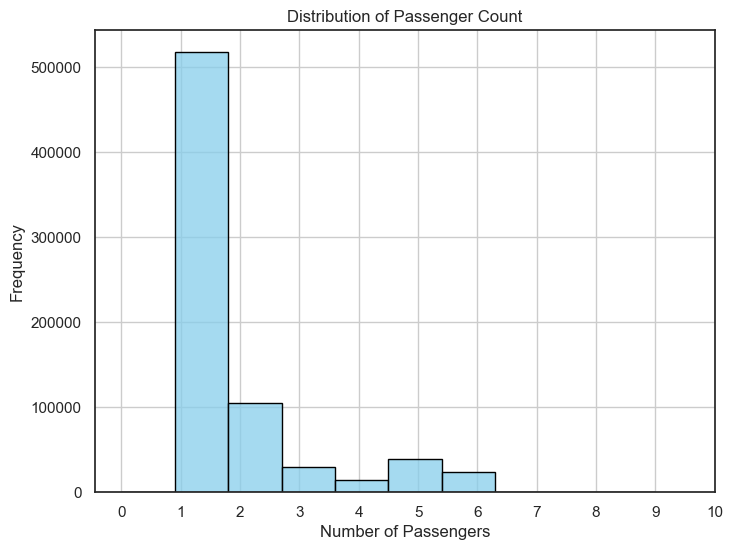

In [112]:
# Plotting the distribution of passenger count
plt.figure(figsize=(8, 6))
sns.histplot(data['passenger_count'], bins=10, kde=False, color='skyblue', edgecolor='black')
plt.title('Distribution of Passenger Count')
plt.xticks(range(0, 11))
plt.xlabel('Number of Passengers')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

- Most people use taxis for personal/solo travel in NYC.
- The distribution makes sense as typical taxi rides will usually have 1-2 passengers and may include 3 or more passengers in rare cases.
- Passenger count in this case this categorical(i.e. split into classes)

## Store and Forward Flag Distribution

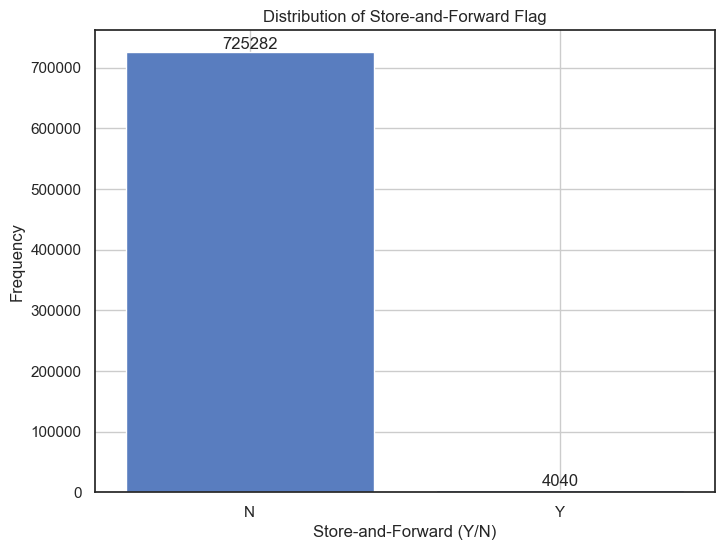

In [113]:
# Plotting the distribution of store_and_fwd_flag with Y and N rotated vertically
# Plotting the distribution of store_and_fwd_flag using sns.barplot
plt.figure(figsize=(8, 6))
sns_barplot = sns.barplot(x=data['store_and_fwd_flag'].value_counts().index,
            y=data['store_and_fwd_flag'].value_counts().values)

# Annotating each bar with its respective count
for i, count in enumerate(data['store_and_fwd_flag'].value_counts().values):
    sns_barplot.text(i, count + 1000, str(count), ha='center', va='bottom')

# Rotating the x-axis labels to be vertical
plt.title('Distribution of Store-and-Forward Flag')
plt.xlabel('Store-and-Forward (Y/N)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

- Since the vast majority of trips had the N flag, this indicates the trip data was not stored before being forwarded to vendor indicating that most trips had real-time connectivity and data was transmitted directly
- Trips where store and forward are needed are very rare likely because in NYC connectivity issues are very uncommon and will seldomly occur in areas with poor network coverage or other remote areas.
- Store-and-forward flag is highly skewed so it's not a good feature to use in the ML Model when predicting the trip duration.

## Extract Information from Dataset to Create New Features(Some Feature Engineering)

In [114]:
# Convert pickup_datetime and dropoff_datetime to datetime objects for easier extraction
data['pickup_datetime'] = pd.to_datetime(data['pickup_datetime'])
data['dropoff_datetime'] = pd.to_datetime(data['dropoff_datetime'])

# Creating new columns: hour, day of the week, and month from pickup_datetime and dropoff_datetime
data['pickup_hour'] = data['pickup_datetime'].dt.hour
data['pickup_day_of_week'] = data['pickup_datetime'].dt.weekday  # Day of the week
data['pickup_month'] = data['pickup_datetime'].dt.month  # Month

# Creating new columns: hour, day of the week, and month from pickup_datetime
data['dropoff_hour'] = data['dropoff_datetime'].dt.hour
data['dropoff_day_of_week'] = data['dropoff_datetime'].dt.weekday  # Day of the week
data['dropoff_month'] = data['dropoff_datetime'].dt.month  # Month

# Display the first few rows to show the new columns
data[['pickup_datetime', 'pickup_hour', 'pickup_day_of_week', 'pickup_month', 'dropoff_datetime', 'dropoff_hour', 'dropoff_day_of_week', 'dropoff_month']].head()


,pickup_datetime,pickup_hour,pickup_day_of_week,pickup_month,dropoff_datetime,dropoff_hour,dropoff_day_of_week,dropoff_month
0,2016-02-29 16:40:21,16,0,2,2016-02-29 16:47:01,16,0,2
1,2016-03-11 23:35:37,23,4,3,2016-03-11 23:53:57,23,4,3
2,2016-02-21 17:59:33,17,6,2,2016-02-21 18:26:48,18,6,2
3,2016-01-05 09:44:31,9,1,1,2016-01-05 10:03:32,10,1,1
4,2016-02-17 06:42:23,6,2,2,2016-02-17 06:56:31,6,2,2


In [115]:
# Calculate distance travelled on trip given the 2 latitude and longitude points using geopy

# Function to calculate distance using geopy
def geopy_distance(lat1, lon1, lat2, lon2):
    # Using geodesic to calculate distance in kilometers
    return geodesic((lat1, lon1), (lat2, lon2)).kilometers

# Applying the geopy function to calculate distance for each trip
data['distance_traveled_km'] = data.apply(
    lambda row: geopy_distance(row['pickup_latitude'], row['pickup_longitude'], 
                               row['dropoff_latitude'], row['dropoff_longitude']), axis=1)

# Display the first few rows to check the new column
data[['pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude', 'distance_traveled_km']].head()


,pickup_latitude,pickup_longitude,dropoff_latitude,dropoff_longitude,distance_traveled_km
0,40.778873,-73.953918,40.771164,-73.963875,1.199770
1,40.731743,-73.988312,40.694931,-73.994751,4.123945
2,40.721458,-73.997314,40.774918,-73.948029,7.250436
3,40.759720,-73.961670,40.780628,-73.956779,2.358287
4,40.708469,-74.017120,40.740631,-73.988182,4.328155


/var/folders/dl/kmhmwhq165lfzmjz3fw7b2q00000gn/T/ipykernel_2390/3255304904.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['log_trip_duration'], kde=False, bins=200)


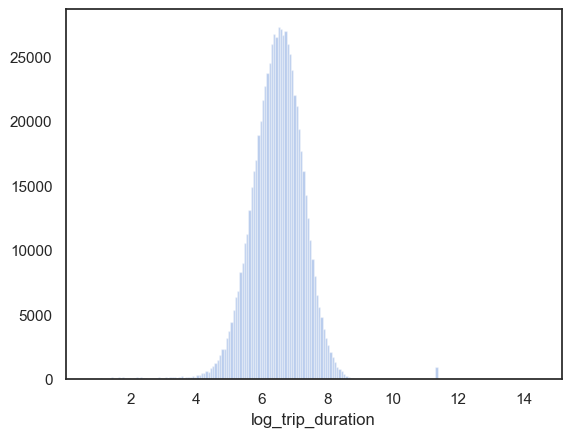

In [116]:
# Log transform the trip duration to change right-skewed distribution to normal distribution
# This compresses the large values reducing the scale of the extreme outliers greatly
data['log_trip_duration'] = np.log(data['trip_duration'].values+1)
sns.distplot(data['log_trip_duration'], kde=False, bins=200)
plt.show()

In [117]:
# Display first 5 rows of data with new columns
data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_hour,pickup_day_of_week,pickup_month,dropoff_hour,dropoff_day_of_week,dropoff_month,distance_traveled_km,log_trip_duration
0,id1080784,2,2016-02-29 16:40:21,2016-02-29 16:47:01,1,-73.953918,40.778873,-73.963875,40.771164,N,400,16,0,2,16,0,2,1.199770,5.993961
1,id0889885,1,2016-03-11 23:35:37,2016-03-11 23:53:57,2,-73.988312,40.731743,-73.994751,40.694931,N,1100,23,4,3,23,4,3,4.123945,7.003974
2,id0857912,2,2016-02-21 17:59:33,2016-02-21 18:26:48,2,-73.997314,40.721458,-73.948029,40.774918,N,1635,17,6,2,18,6,2,7.250436,7.400010
3,id3744273,2,2016-01-05 09:44:31,2016-01-05 10:03:32,6,-73.961670,40.759720,-73.956779,40.780628,N,1141,9,1,1,10,1,1,2.358287,7.040536
4,id0232939,1,2016-02-17 06:42:23,2016-02-17 06:56:31,1,-74.017120,40.708469,-73.988182,40.740631,N,848,6,2,2,6,2,2,4.328155,6.744059


In [118]:
# Display last 5 rows of data with new columns
data.tail()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_hour,pickup_day_of_week,pickup_month,dropoff_hour,dropoff_day_of_week,dropoff_month,distance_traveled_km,log_trip_duration
729317,id3905982,2,2016-05-21 13:29:38,2016-05-21 13:34:34,2,-73.965919,40.789780,-73.952637,40.789181,N,296,13,5,5,13,5,5,1.123068,5.693732
729318,id0102861,1,2016-02-22 00:43:11,2016-02-22 00:48:26,1,-73.996666,40.737434,-74.001320,40.731911,N,315,0,0,2,0,0,2,0.728563,5.755742
729319,id0439699,1,2016-04-15 18:56:48,2016-04-15 19:08:01,1,-73.997849,40.761696,-74.001488,40.741207,N,673,18,4,4,19,4,4,2.295919,6.513230
729320,id2078912,1,2016-06-19 09:50:47,2016-06-19 09:58:14,1,-74.006706,40.708244,-74.013550,40.713814,N,447,9,6,6,9,6,6,0.846722,6.104793
729321,id1053441,2,2016-01-01 17:24:16,2016-01-01 17:44:40,4,-74.003342,40.743839,-73.945847,40.712841,N,1224,17,4,1,17,4,1,5.953285,7.110696


## Visualize Pickup and Dropoff Locations in NYC

In [119]:
'''
# Center the map around NYC coordinates
map_center = [40.730610, -73.935242]

# Create a base map
nyc_map = folium.Map(location=map_center, zoom_start=10)

# Add lines connecting pickup and dropoff locations
for _, row in data.iterrows():
    # Create a polyline between pickup and dropoff locations
    folium.PolyLine(
        locations=[[row['pickup_latitude'], row['pickup_longitude']],
                   [row['dropoff_latitude'], row['dropoff_longitude']]],
        color='blue', weight=1.5, opacity=0.7
    ).add_to(nyc_map)

# Save the map to an HTML file
nyc_map.save("nyc_map.html")
'''

'\n# Center the map around NYC coordinates\nmap_center = [40.730610, -73.935242]\n\n# Create a base map\nnyc_map = folium.Map(location=map_center, zoom_start=10)\n\n# Add lines connecting pickup and dropoff locations\nfor _, row in data.iterrows():\n    # Create a polyline between pickup and dropoff locations\n    folium.PolyLine(\n        locations=[[row[\'pickup_latitude\'], row[\'pickup_longitude\']],\n                   [row[\'dropoff_latitude\'], row[\'dropoff_longitude\']]],\n        color=\'blue\', weight=1.5, opacity=0.7\n    ).add_to(nyc_map)\n\n# Save the map to an HTML file\nnyc_map.save("nyc_map.html")\n'

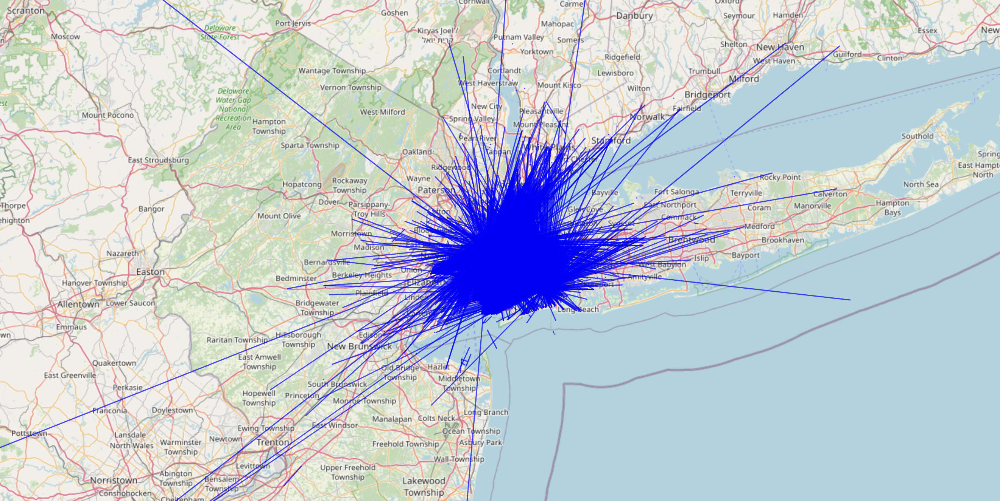

- From the map above, you can see how a majority of the taxi trips are within New York City with a few taxi trips that exit out of New York City into another city.

In [120]:
# Center the map around NYC coordinates
map_center = [40.730610, -73.935242]

# Sample 500 random trips from the data for visualization
sampled_data = data.sample(n=500, random_state=42)

# Create a base map
nyc_map2 = folium.Map(location=map_center, zoom_start=10)

# Add lines connecting pickup and dropoff locations for the sampled data
for _, row in sampled_data.iterrows():
    # Create a polyline between pickup and dropoff locations
    folium.PolyLine(
        locations=[[row['pickup_latitude'], row['pickup_longitude']],
                   [row['dropoff_latitude'], row['dropoff_longitude']]],
        color='blue', weight=1.5, opacity=0.7
    ).add_to(nyc_map2)
nyc_map2.save("nyc_map2.html")
# Display the map in Jupyter
nyc_map2


### Map of Pickup Locations in Clusters

In [121]:
# Create a base map centered around NYC for pickup locations
pickup_cluster_map = folium.Map(location=map_center, zoom_start=12)

# Create a MarkerCluster object for pickup locations
pickup_marker_cluster = MarkerCluster().add_to(pickup_cluster_map)

# Add pickup locations to the cluster
for _, row in sampled_data.iterrows():
    folium.Marker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        popup=f"Pickup: {row['pickup_datetime']}",
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(pickup_marker_cluster)

# Optionally save the pickup cluster map to an HTML file
pickup_cluster_map.save("pickup_cluster_map.html")

# Display the map in Jupyter
pickup_cluster_map

### Map of Dropoff Locations in Clusters

In [122]:
# Create a base map centered around NYC for dropoff locations
dropoff_cluster_map = folium.Map(location=[40.730610, -73.935242], zoom_start=12)

# Create a MarkerCluster object for dropoff locations
dropoff_marker_cluster = MarkerCluster().add_to(dropoff_cluster_map)

# Add dropoff locations to the cluster
for _, row in sampled_data.iterrows():
    folium.Marker(
        location=[row['dropoff_latitude'], row['dropoff_longitude']],
        popup=f"Dropoff: {row['dropoff_datetime']}",
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(dropoff_marker_cluster)

# Optionally save the dropoff cluster map to an HTML file
dropoff_cluster_map.save("dropoff_cluster_map.html")

dropoff_cluster_map

- From the clusters on this map, most of the pickup and dropoff locations are at the center of New York in Manhattan
- However, due to the limited sample size(since many resources have to be used to produce clusters for 730000 trips), the cluster map is insufficient in drawing deeper insights in the dataset and other methods of analysis need to be performed

## Time-Based Analysis

### Analyze Trips by Hour of Day

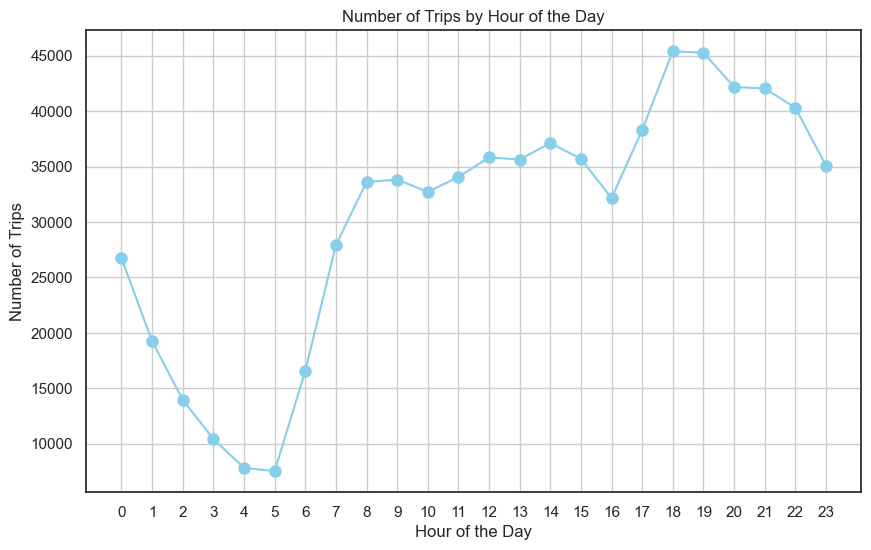

In [123]:
# Analyze Trips by Hour of the Day
plt.figure(figsize=(10,6))
data['pickup_hour'].value_counts().sort_index().plot(kind='line', color='skyblue', marker='o', linestyle='-', markersize=8)
plt.title('Number of Trips by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Trips')
plt.grid(True)
plt.xticks(rotation=0, ticks=range(0, 24), labels=range(0, 24))
plt.show()

In [124]:
data['pickup_hour'].value_counts()

pickup_hour
18    45404
19    45262
20    42165
21    42045
22    40293
17    38313
14    37120
12    35820
15    35687
13    35630
23    35069
11    34061
9     33821
8     33612
10    32713
16    32147
7     27907
0     26726
1     19243
6     16552
2     13960
3     10424
4      7827
5      7521
Name: count, dtype: int64

- 18th to 22nd hour (6 PM to 10 PM) tends to see a high number of trips. This corresponds to the evening rush hour and likely nightlife activity. Many people are heading home from work, going out for dinner, or engaging in social activities during these hours.
- Another visible increase happens around 7 AM to 9 AM, aligning with the morning commute period.
- Lower trip counts occur between 3AM to 5AM since most people are sleeping.
- Hours could also be split into a categorical variable(i.e. 11pm to 5am is nighttime, 6am to 11am is morning, etc.)

### Analyze Trips by Day of Week

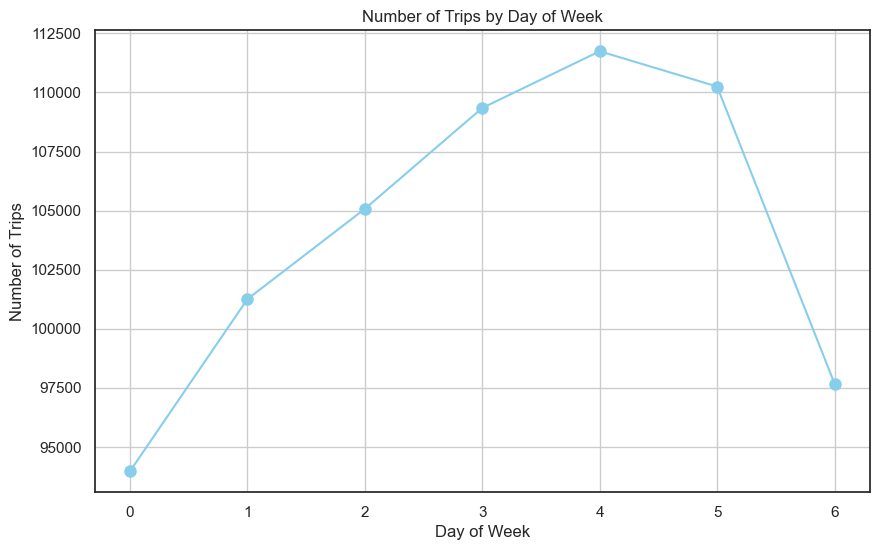

In [125]:
# Analyze Trips by Day of Week
plt.figure(figsize=(10,6))
data['pickup_day_of_week'].value_counts().sort_index().plot(kind='line', color='skyblue', marker='o', linestyle='-', markersize=8)
plt.title('Number of Trips by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Trips')
plt.grid(True)
plt.xticks(rotation=0, ticks=range(0, 7), labels=range(0, 7))
plt.show()

In [126]:
data['pickup_day_of_week'].value_counts()

pickup_day_of_week
4    111744
5    110252
3    109344
2    105074
1    101254
6     97682
0     93972
Name: count, dtype: int64

- Friday and Saturday have the highest number of trips likely because of weekend activities, nightlife, and social gatherings.
- Sunday shows a slight dip in number of trips as people are likely preparing for their work week starting on Monday and not going around as much.
- However, from this plot it is difficult to understand why Mondays has a lower number of trips and as the weekdays pass by the number of trips increases(this may indicate other factors such as month come into play that are affecting the distribution of trips per day).

### Analyze Trips by Month

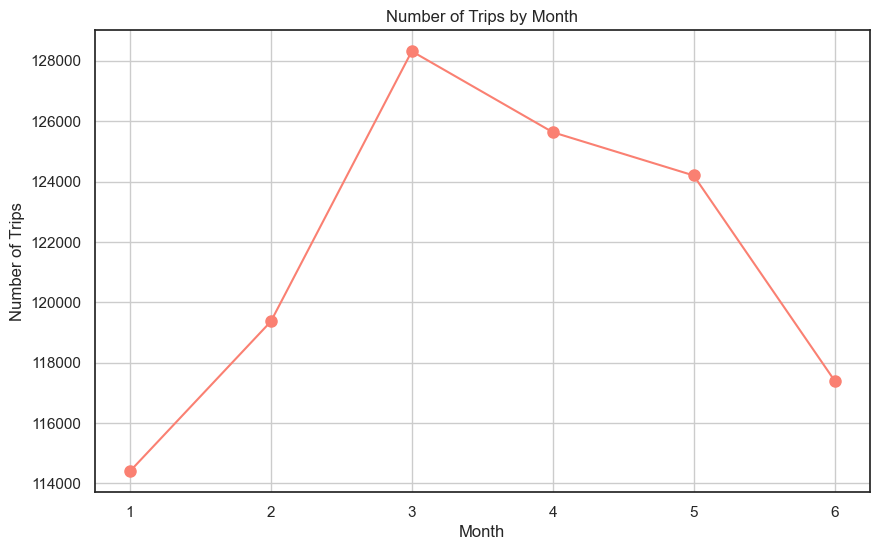

In [127]:
# Analyze Trips by Month
plt.figure(figsize=(10,6))
data['pickup_month'].value_counts().sort_index().plot(kind='line', color='salmon', marker='o', linestyle='-', markersize=8)
plt.title('Number of Trips by Month')
plt.xlabel('Month')
plt.ylabel('Number of Trips')
plt.grid(True)
plt.xticks(rotation=0)
plt.show()


In [128]:
data['pickup_month'].value_counts()

pickup_month
3    128316
4    125634
5    124201
2    119364
6    117406
1    114401
Name: count, dtype: int64

- For the most part, the trip counts are fairly consistent across months from January to June, with March showing the highest number of trips.
- Though January has the least number of trips likely do to the fact it's the coldest month which discourages people from commuting
- March likely has the most trips due to the fact it marks the beginning of spring where the weather improves
- May likely has less taxi trips since more people may commute through bikes or walking in the city as traffic usually worsens around this period.
- The months in this dataset however are insufficient overall as there is no data on trips from July to December.
- July to December contain significant timelines in which there can be more trips like summer break from July to August where more tourists will visit New York and winter break in December where many are out during the holidays shopping.

## Distance vs. Trip Duration

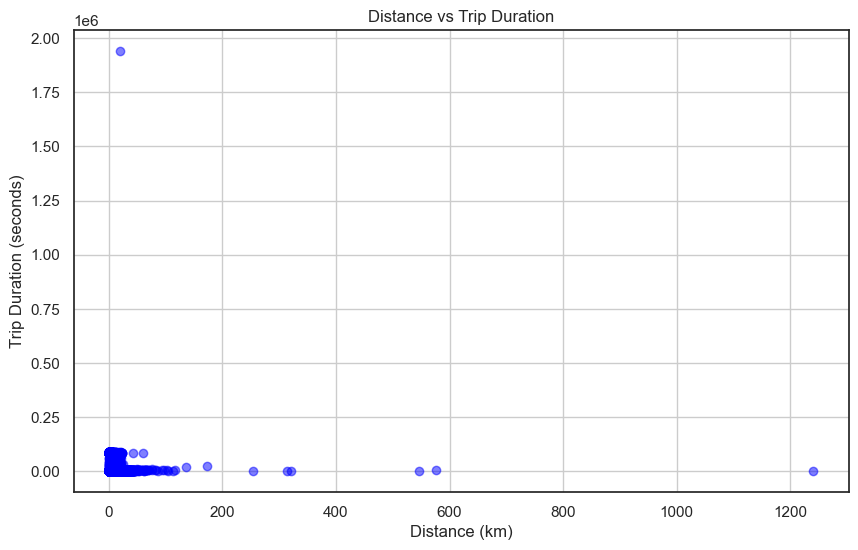

In [129]:
# Scatter plot for distance vs. trip duration (in minutes)
plt.figure(figsize=(10, 6))
plt.scatter(data['distance_traveled_km'], data['trip_duration'], alpha=0.5, color='blue')
plt.title('Distance vs Trip Duration')
plt.xlabel('Distance (km)')
plt.ylabel('Trip Duration (seconds)')
plt.grid(True)
plt.show()

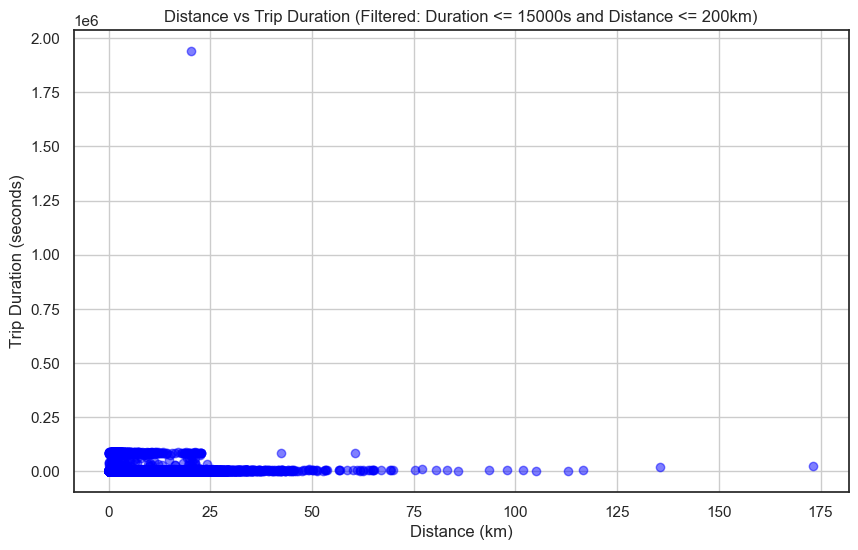

In [130]:
# Scatter plot for distance vs. trip duration (in minutes)
plt.figure(figsize=(10, 6))
filtered_data = data[(data['distance_traveled_km'] <= 200)]
plt.scatter(filtered_data['distance_traveled_km'], filtered_data['trip_duration'], alpha=0.5, color='blue')
plt.title('Distance vs Trip Duration (Filtered: Duration <= 15000s and Distance <= 200km)')
plt.xlabel('Distance (km)')
plt.ylabel('Trip Duration (seconds)')
plt.grid(True)
plt.show()

In [131]:
# Calculate correlation between distance and trip duration
correlation = data['distance_traveled_km'].corr(data['trip_duration'])
print(f'Correlation between distance and trip duration: {correlation:.2f}')

Correlation between distance and trip duration: 0.13


- Thus, this means that more distance travelled on trip means it slightly leads to longer trips but this relationship isn't consistent across all the data points.
- There are other factors that are affecting the trip duration such as traffic, road conditions, route efficiency, events, time of day, etc.

## Trip Duration for Each Vendor

In [132]:
# Group the data by vendor_id and calculate summary statistics for trip duration
trip_duration_stats = data.groupby('vendor_id', observed=False)['trip_duration'].describe()
trip_duration_stats

,count,mean,std,min,25%,50%,75%,max
vendor_id,,,,,,,,
1,338841.0,837.096021,3396.706635,1.0,394.0,659.0,1068.0,1939736.0
2,390481.0,1052.136219,4226.377832,1.0,399.0,666.0,1083.0,86391.0


Text(35.28034722222223, 0.5, 'Trip Duration(seconds)')

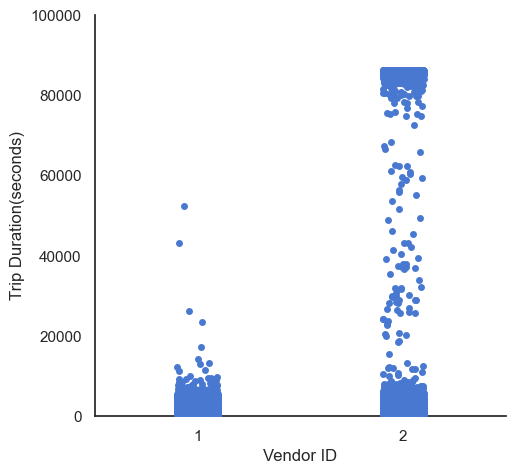

In [133]:
# Catplot for trip duration by vendor
sns.catplot(x="vendor_id", y="trip_duration",kind="strip",data=data)
plt.ylim(0, 100000)
plt.xlabel("Vendor ID")
plt.ylabel("Trip Duration(seconds)")

- From the catplot above, Vendor 2 has more extreme outliers than Vendor 1.
- This shows that Vendor 2 has far more long duration trips than Vendor 1 so Vendor 2 likely handles more long-distance trips whereas Vendor 1 handles more local trips.
- From the table above, Vendor 2 also has more trips than Vendor 1.

## Store-and-Forward Flags for Each Vendor

store_and_fwd_flag         N       Y
vendor_id                           
1                   334801.0  4040.0
2                   390481.0     NaN


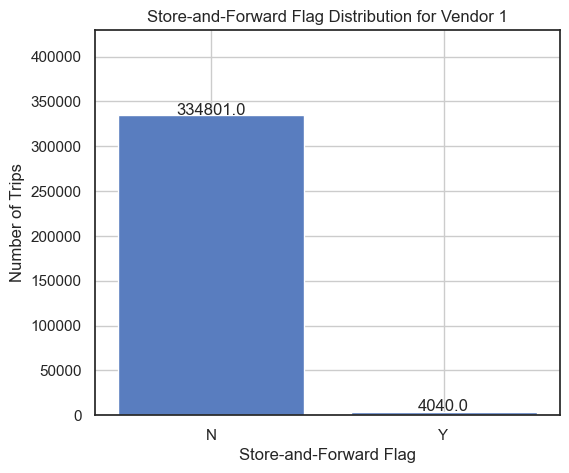

posx and posy should be finite values
posx and posy should be finite values


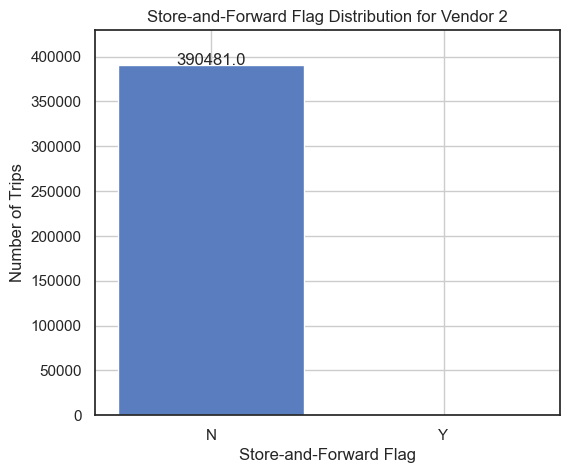

In [134]:
# Grouping the data by vendor_id and store_and_fwd_flag
vendor_store_fwd = data.groupby(['vendor_id', 'store_and_fwd_flag'], observed=False).size().unstack()
print(vendor_store_fwd)

# Plot for Vendor 1
plt.figure(figsize=(6, 5))
sns.barplot(x=vendor_store_fwd.columns, y=vendor_store_fwd.loc[1].values)
plt.title('Store-and-Forward Flag Distribution for Vendor 1')
plt.xlabel('Store-and-Forward Flag')
plt.ylabel('Number of Trips')
plt.ylim(0, max(vendor_store_fwd.max()) * 1.1)  # Setting the same limit for comparison
for i, count in enumerate(vendor_store_fwd.loc[1].values):
    plt.text(i, count + 500, str(count), ha='center')  # Annotating the counts
plt.grid(True)
plt.show()

# Plot for Vendor 2
plt.figure(figsize=(6, 5))
sns.barplot(x=vendor_store_fwd.columns, y=vendor_store_fwd.loc[2].values)
plt.title('Store-and-Forward Flag Distribution for Vendor 2')
plt.xlabel('Store-and-Forward Flag')
plt.ylabel('Number of Trips')
plt.ylim(0, max(vendor_store_fwd.max()) * 1.1)  # Same y-axis limit for consistent scaling
for i, count in enumerate(vendor_store_fwd.loc[2].values):
    plt.text(i, count + 500, str(count), ha='center')  # Annotating the counts
plt.grid(True)
plt.show()

- From this distribution, it shows Vendor 1 may experience connectivity issues in some areas whereas Vendor 2 has no connectivity issues.
- However, given the skewed nature of the data, this doesn't add much towards predicting future trip durations. (Log transformation will need to be performed so store and forward flag can conform to normality)

## Get Map of Location Where There is Store-and-Forward

In [135]:
# Step 1: Filter the data for 'N' store-and-forward flag
n_flag_data = data[data['store_and_fwd_flag'] == 'Y']

# Step 2: Create a base map centered around NYC (assuming that's the general location)
nyc_flag_map = folium.Map(location=map_center, zoom_start=10)

# Step 3: Add pickup locations to the map
for _, row in n_flag_data.iterrows():
    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=1,
        color='blue',
        fill=True,
        fill_opacity=0.7
    ).add_to(nyc_flag_map)

# Step 4: Display the map
nyc_flag_map

- The presence of Y flags within NYC could indicate local network disruptions in certain areas, such as tunnels, underground locations, or areas with high-rise buildings that might interfere with signal strength.

## Scatterplots for Pickup and Dropoff Locations

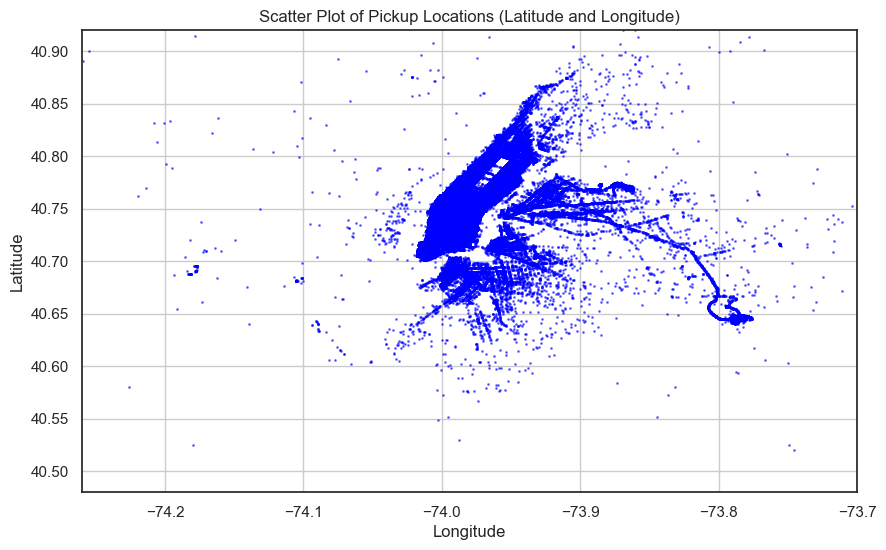

In [136]:
# Scatter plot for pickup locations
plt.figure(figsize=(10, 6))
plt.scatter(data['pickup_longitude'], data['pickup_latitude'], c='blue', s=1, alpha=0.5)
plt.title('Scatter Plot of Pickup Locations (Latitude and Longitude)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.ylim((40.48, 40.92)) # Boundaries for New York City for latitude
plt.xlim((-74.26, -73.70)) # Boundaries for New York City for longitude
plt.grid(True)
plt.show()

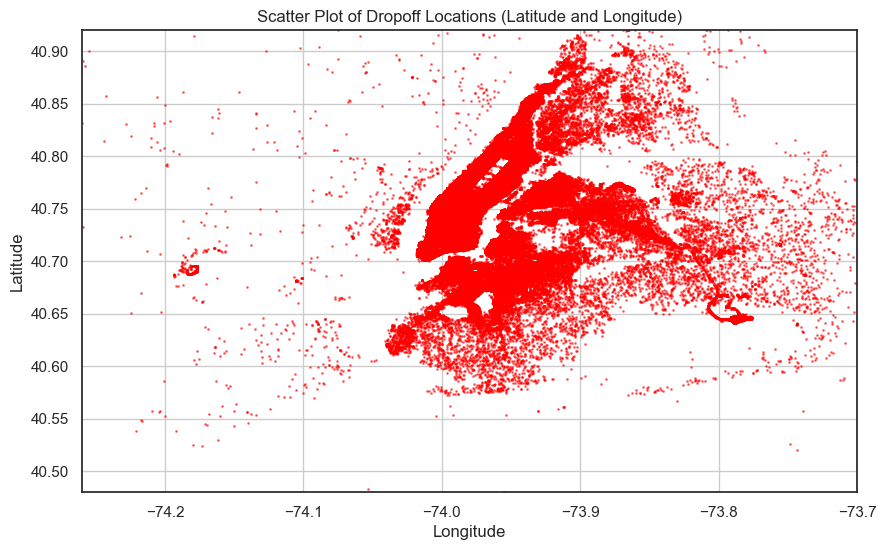

In [137]:
# Scatter plot for dropoff locations
plt.figure(figsize=(10, 6))
plt.scatter(data['dropoff_longitude'], data['dropoff_latitude'], c='red', s=1, alpha=0.5)
plt.title('Scatter Plot of Dropoff Locations (Latitude and Longitude)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.ylim((40.48, 40.92)) # Boundaries for New York City for latitude
plt.xlim((-74.26, -73.70)) # Boundaries for New York City for longitude
plt.grid(True)
plt.show()

- From the scatterplots, Both the pickup and dropoff points are heavily concentrated in New York City, particularly in Manhattan as Manhattan has a high population density.
- The drop off locations are more spread out compared to the pickup locations indicating that passengers might be travelling to more residential/suburban areas.

## Trip Duration vs Weekday

<Figure size 1000x600 with 0 Axes>

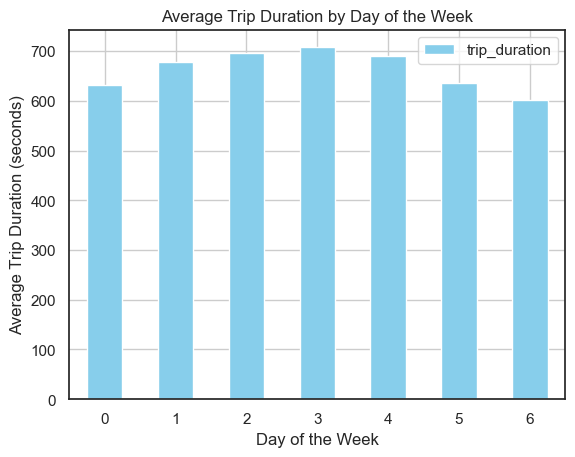

In [138]:
avg_trip_duration_by_day = pd.DataFrame(data.groupby(['pickup_day_of_week'])['trip_duration'].median())
plt.figure(figsize=(10, 6))
avg_trip_duration_by_day.plot(kind='bar', color='skyblue')
plt.title('Average Trip Duration by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Trip Duration (seconds)')
plt.xticks(rotation=360)
plt.grid(True)
plt.show()

- From this bar plot, the weekdays tend to have the longer trip due to traffic throughout the city on weekdays

<Figure size 1000x600 with 0 Axes>

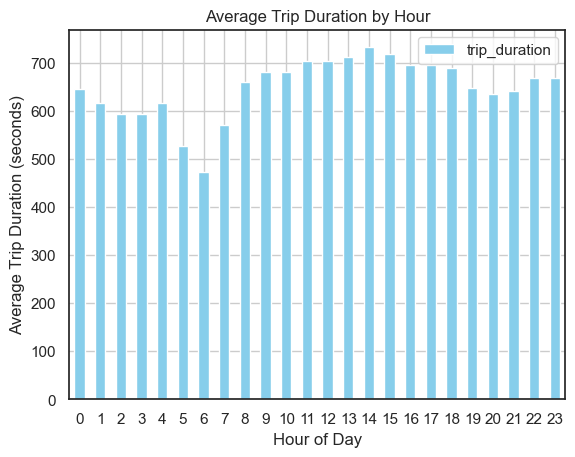

In [139]:
avg_trip_duration_by_hour = pd.DataFrame(data.groupby(['pickup_hour'])['trip_duration'].median())
plt.figure(figsize=(10, 6))
avg_trip_duration_by_hour.plot(kind='bar', color='skyblue')
plt.title('Average Trip Duration by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Average Trip Duration (seconds)')
plt.xticks(rotation=360)
plt.grid(True)
plt.show()

- Trip duration is much lower during the late night hours from 6pm and onwards due to low traffic density.
- In the morning, there is a significant dip in trip duration indicating the lowest traffic density at this time.
- In the afternoon, there is far more traffic on the road contributing to the longer trip durations.

## Trip Duration vs Vendor ID

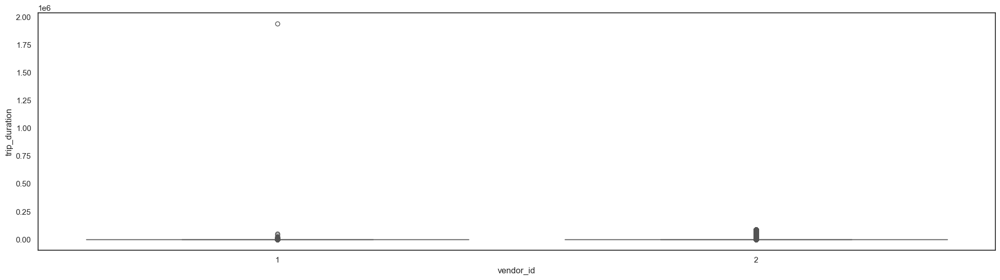

In [140]:
plt.figure(figsize=(24, 6))
sns.boxplot(x='vendor_id', y='trip_duration', data=data)
plt.show()

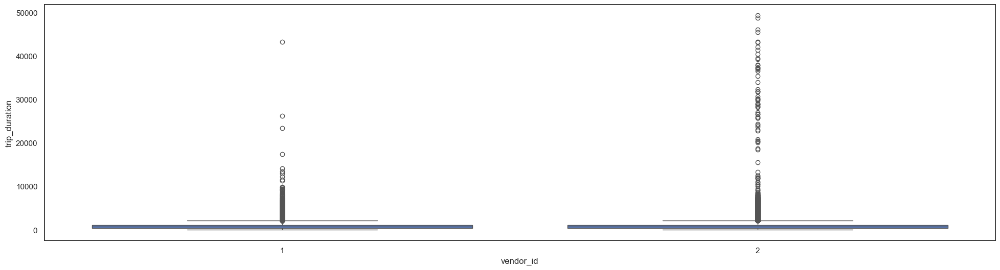

In [141]:
# Replot without the extreme outliers
plt.figure(figsize=(24, 6))
filter_data = data[data['trip_duration'] < 50000]
sns.boxplot(x='vendor_id', y='trip_duration', data=filter_data)
plt.show()

- From this filtered boxplot, vendor 2 has far more outliers than vendor 1 indicating it does longer trips overall

## Mean Trip Duration for Each Vendor

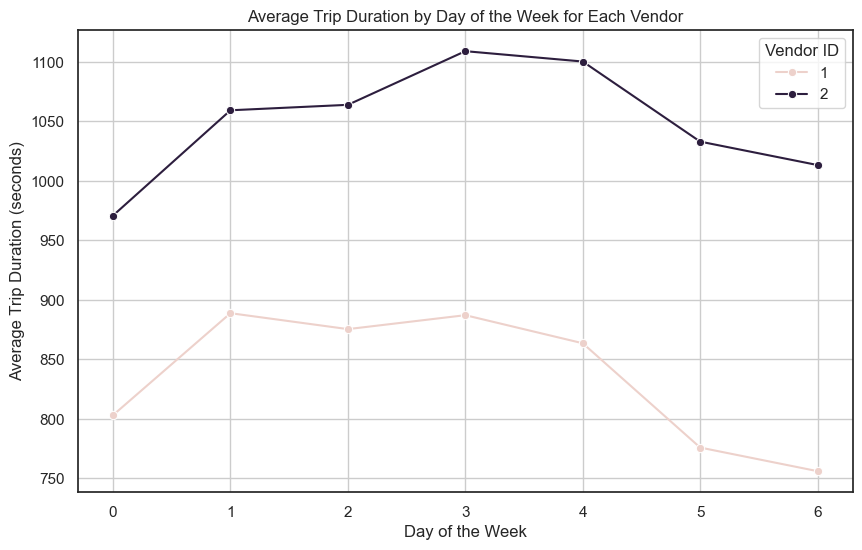

In [142]:
# Get average trip duration for each day for each vendor
avg_trip_duration_by_day_vendor = pd.DataFrame(data.groupby(['vendor_id', 'pickup_day_of_week'])['trip_duration'].mean())
avg_trip_duration_by_day_vendor.reset_index(inplace=True)

# Plot using sns.lineplot
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=avg_trip_duration_by_day_vendor,
    x='pickup_day_of_week', 
    y='trip_duration', 
    hue='vendor_id',
    marker='o'
)

plt.title('Average Trip Duration by Day of the Week for Each Vendor')
plt.xlabel('Day of the Week')
plt.ylabel('Average Trip Duration (seconds)')
plt.grid(True)
plt.legend(title='Vendor ID')
plt.show()

## Median Trip Duration for Each Vendor

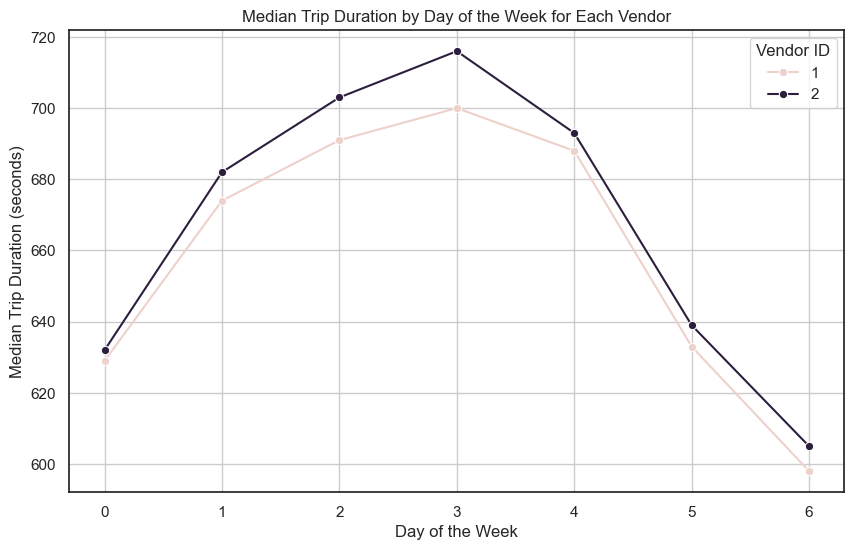

In [143]:
# Get median trip duration for each day for each vendor
med_trip_duration_by_day_vendor = pd.DataFrame(data.groupby(['vendor_id', 'pickup_day_of_week'])['trip_duration'].median())
med_trip_duration_by_day_vendor.reset_index(inplace=True)

# Plot using sns.lineplot
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=med_trip_duration_by_day_vendor,
    x='pickup_day_of_week', 
    y='trip_duration', 
    hue='vendor_id',
    marker='o'
)

plt.title('Median Trip Duration by Day of the Week for Each Vendor')
plt.xlabel('Day of the Week')
plt.ylabel('Median Trip Duration (seconds)')
plt.grid(True)
plt.legend(title='Vendor ID')
plt.show()

- The median trip duration for both vendors is very similar but vendor 2 has a higher mean trip duration than vendor 1.
- This cites the importance of using the correct central tendency for the prediction model.

## Trip Duration vs Passenger Count

In [144]:
data['passenger_count'].value_counts()

passenger_count
1    517415
2    105097
5     38926
3     29692
6     24107
4     14050
0        33
7         1
9         1
Name: count, dtype: int64

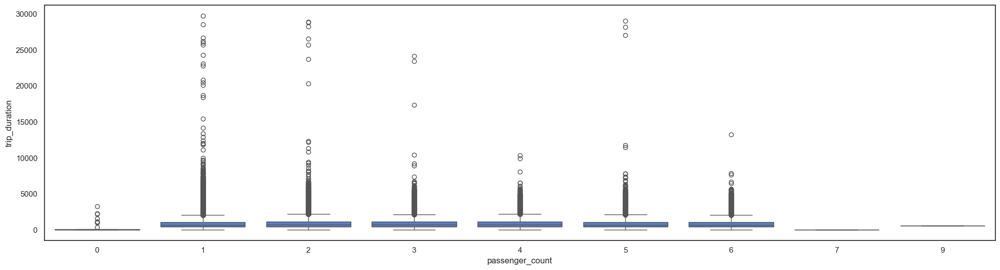

In [145]:
plt.figure(figsize=(24,6))
filtered_data = data[data['trip_duration'] < 30000]
sns.boxplot(x='passenger_count', y='trip_duration', data=filtered_data)
plt.show()

- From the boxplot, there isn't much of a difference in the distribution of trip duration for 1-6 passengers
- 33 entries in which there are 0 passengers could indicate a data entry error
- For higher passenger counts, number of outliers is reduced likely due to lower frequency of trips at higher passenger counts

## Correlation Heatmap

<Axes: >

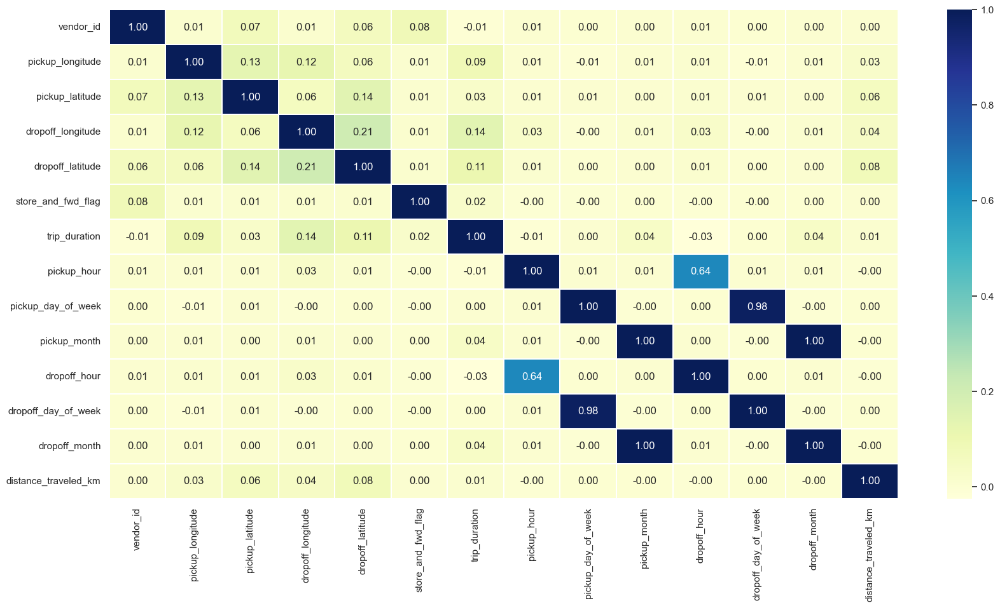

In [146]:
plt.figure(figsize=(20, 10))
new_data = data.drop(['id', 'pickup_datetime', 'dropoff_datetime', 'passenger_count', 'log_trip_duration'], axis=1)
corrMatrix = new_data.apply(lambda x: pd.factorize(x)[0]).corr()
sns.heatmap(corrMatrix, 
            annot=True,
            fmt=".2f",
            xticklabels=corrMatrix.columns, 
            yticklabels=corrMatrix.columns, 
            linewidths=.2, 
            cmap='YlGnBu')

- From the correlation heatmap, the features most correlated to trip_duration are the pickup and dropoff latitude and longitude.
- However many of the features do not have a strong correlation with the trip_duration citing that the relationship between the independent variables and trip_duration are non-linear.

# 2. Data Preprocessing

## Removing Extreme Outliers from Dataset

From the EDA above:
- There are taxi rides in which the passenger count is 0, which isn't realistic in the context of this problem as a taxi ride has at least 1 passengers in it.
- There are 2 taxi rides in which there are 7 or more passengers which is also unrealistic given the passenger capacity of the taxis in New York.
    - Passenger count of 6 makes somewhat sense if some of the passengers are infants/toddlers.
- There are also extreme outliers for the trip duration as there are trips with 0 seconds and trips that may last more than a day so these should be removed from dataset.
- There are also latitude and longitude coordinates that don't reside within the New York boroughs(Manhattan, Brooklyn, Quens, The Bronx, Staten Island) so these should be removed as well.

In [147]:

# Remove outliers in passenger count (passenger count of 0 and 7-9)
new_taxi_data = data[(data['passenger_count'] > 0) & (data['passenger_count'] < 7)]

# Due to an extreme outlier that be 10^4 larger than the next longest trip duration, remove this outlier before getting the mean
max_trip_duration = new_taxi_data['trip_duration'].max()
new_taxi_data = new_taxi_data[new_taxi_data['trip_duration'] != max_trip_duration]

# Remove outliers in trip duration (values more than 2 standard deviations from the mean)
mean_trip_duration = new_taxi_data['trip_duration'].mean()
std_trip_duration = new_taxi_data['trip_duration'].std()
lower_bound = mean_trip_duration - 2 * std_trip_duration
upper_bound = mean_trip_duration + 2 * std_trip_duration
new_taxi_data = new_taxi_data[(new_taxi_data['trip_duration'] >= lower_bound) & (new_taxi_data['trip_duration'] <= upper_bound)]

# Define latitude and longitude bounds for NYC boroughs
nyc_latitude_range = (40.4774, 40.9176)
nyc_longitude_range = (-74.2591, -73.7004)

# Filter data to include only points within NYC boundaries
new_taxi_data = new_taxi_data[
    (new_taxi_data['pickup_latitude'].between(nyc_latitude_range[0], nyc_latitude_range[1])) &
    (new_taxi_data['pickup_longitude'].between(nyc_longitude_range[0], nyc_longitude_range[1])) &
    (new_taxi_data['dropoff_latitude'].between(nyc_latitude_range[0], nyc_latitude_range[1])) &
    (new_taxi_data['dropoff_longitude'].between(nyc_longitude_range[0], nyc_longitude_range[1]))
]

# Summary of the remaining data
print("Maximum Trip Duration:", max_trip_duration)
print("Remaining Rows:", len(data))
print("Mean Trip Duration:", mean_trip_duration)
print("Trip Duration Standard Deviation:", std_trip_duration)
print("Latitude Range (NYC):", nyc_latitude_range)
print("Longitude Range (NYC):", nyc_longitude_range)


Maximum Trip Duration: 1939736
Remaining Rows: 729322
Mean Trip Duration: 949.5972910490534
Trip Duration Standard Deviation: 3127.5901147824034
Latitude Range (NYC): (40.4774, 40.9176)
Longitude Range (NYC): (-74.2591, -73.7004)


## Feature Engineering(Removing Unnecessary Columns from Dataset)

- There are 2 variables in dropoff_datetime and store_and_fwd_flag not available before trip starts and hence won't be used as features in model.
   - For store_and_fwd_flag in particular this feature is useless as an overwhelming majority of trips don't use store and forward as many of these trips are stored on the vendor server anyways.
- The newly created features from dropoff_datetime(dropoff_hour, dropoff_day_of_week, dropoff_month) will also be dropped.
- As pickup_datetime(timestamp feature) has its hour, day of week, and month already extracted, this column is not relevant anymore and can be dropped as the hour, day of week, and month provides more detailed time analysis on the taxi trips.
- The id feature is not needed as it just uniquely identifes each taxi ride and is of no use as a feature in the prediction model.